In [1]:
import MDAnalysis as mda
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','notebook'])

## RMSD Calculation

In [29]:
#Read all the trajectories
ku04amp01_pgl= mda.Universe('ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_compact_compact.tpr', 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_compact_compact.xtc')


## Hydrogen Bond Analysis

### H-bond parameters
  - *d_h_cutoff* (Å) [1.2] : Distance cutoff used for finding donor-hydrogen pairs
  - *d_a_cutoff* (Å) [3.0] : Distance cutoff for hydrogen bonds. This cutoff refers to the D-A distance.
  - *d_h_a_angle_cutoff* (degrees) [150] : D-H-A angle cutoff for hydrogen bonds.

In [38]:
from tqdm.notebook import tqdm

peptide_residues_selection = 'protein and (resid 18 or resid 21 or resid 16 or resid 15 or resid 17 or resid 14)'
ligand_residues_selection = 'resname GL1'
peptide_residues = ku04amp01_pgl.select_atoms(peptide_residues_selection)
ligand_residues = ku04amp01_pgl.select_atoms(ligand_residues_selection)
times = []
com_distances = []
for ts in tqdm(ku04amp01_pgl.trajectory):
    times.append(ku04amp01_pgl.trajectory.time)
    peptide_com = peptide_residues.center_of_mass()
    ligand_com = ligand_residues.center_of_mass()
    distance = np.linalg.norm(peptide_com - ligand_com)
    com_distances.append(distance)

# Optionally, convert to a numpy array for further analysis
times = np.array(times)
com_distances = np.array(com_distances)

  0%|          | 0/5001 [00:00<?, ?it/s]

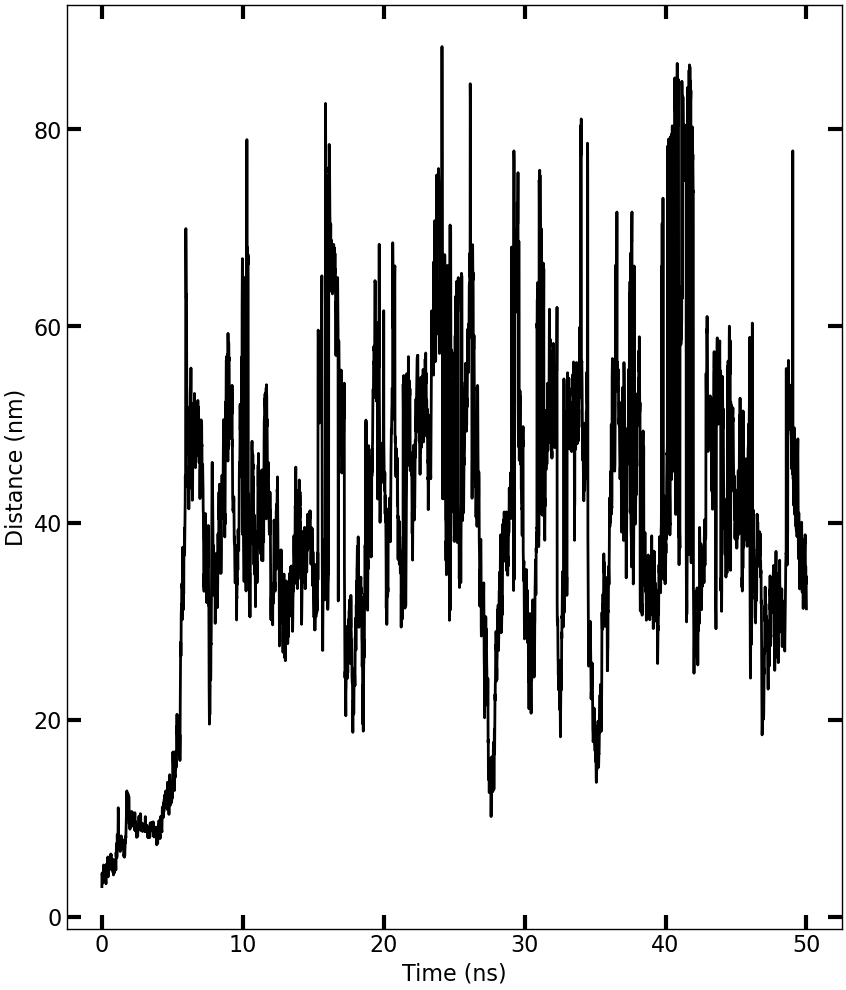

In [51]:
fig, ax = plt.subplots(figsize=(10, 12))

ax.plot(times/1000, com_distances, color='black')
ax.minorticks_off()
ax.tick_params(which='major', length=10, width=3)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Distance (nm)')
plt.savefig('ku04amp01_pgl_complex_distance.png', dpi=600, bbox_inches='tight')

### PCA via GROMACS tools

Go to the `sys_prod` directory, then create an index for backbone, ligand 

`gmx make_ndx -f prod_ku04amp01_pgl_complex.gro -o prod_ku04amp01_pgl_complex_pca.ndx` Choose backbone OR GL1 (PGL was misnamed)

Then, we need to dump the first frame of MD simulation as pdb file (unless that has already been done).

Then, generating the eigenvectors

`gmx covar -s start.pdb -f prod_ku04amp01_pgl_complex_compact_compact.xtc -o prod_ku04amp01_pgl_complex_eigenvalues.xvg -v prod_ku04amp01_pgl_complex_eigenvectors.trr -xpma prod_ku04amp01_pgl_complex_covapic.xpm -n prod_ku04amp01_pgl_complex_pca.ndx`


Selections should be the index just created.

Followed by `gmx anaeig` to generate pc1, pc2 and pc3 files

`gmx anaeig -f prod_ku04amp01_pgl_complex_compact_compact.xtc -s start.pdb -v prod_ku04amp01_pgl_complex_eigenvectors.trr -last 1 -proj prod_ku04amp01_pgl_complex_pc1.xvg -n prod_ku04amp01_pgl_complex_pca.ndx`

`gmx anaeig -f prod_ku04amp01_pgl_complex_compact_compact.xtc -s start.pdb -v prod_ku04amp01_pgl_complex_eigenvectors.trr -first 2 -last 2 -proj prod_ku04amp01_pgl_complex_pc2.xvg -n prod_ku04amp01_pgl_complex_pca.ndx`

`gmx anaeig -f prod_ku04amp01_pgl_complex_compact_compact.xtc -s start.pdb -v prod_ku04amp01_pgl_complex_eigenvectors.trr -first 3 -last 3 -proj prod_ku04amp01_pgl_complex_pc3.xvg -n prod_ku04amp01_pgl_complex_pca.ndx`


Use these three xvg files (`prod_ku04amp01_pgl_complex_pc{1,2,3}.xvg`) to generate the following plots.

In [1]:
import numpy as np

# Function to read XVG file with skip header option
def read_xvg(file_path, skip_header):
    data = []
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines[skip_header:]:
            if '&' in line:
                break
            else:
                data.append([float(val) for val in line.split()])
    data = np.array(data)
    return data[:, 0], data[:, 1]

# File paths for RMSD and radius of gyration XVG files
pc1_file = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_pc1.xvg'
pc2_file = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_pc2.xvg'
pc3_file = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_pc3.xvg'

# Read data from XVG files with skip headers
t1, pc1_data = read_xvg(pc1_file, skip_header=24)  # Adjust skip_header based on your file format
t2, pc2_data = read_xvg(pc2_file, skip_header=24)  # Adjust skip_header based on your file format
t2, pc3_data = read_xvg(pc3_file, skip_header=24)  # Adjust skip_header based on your file format

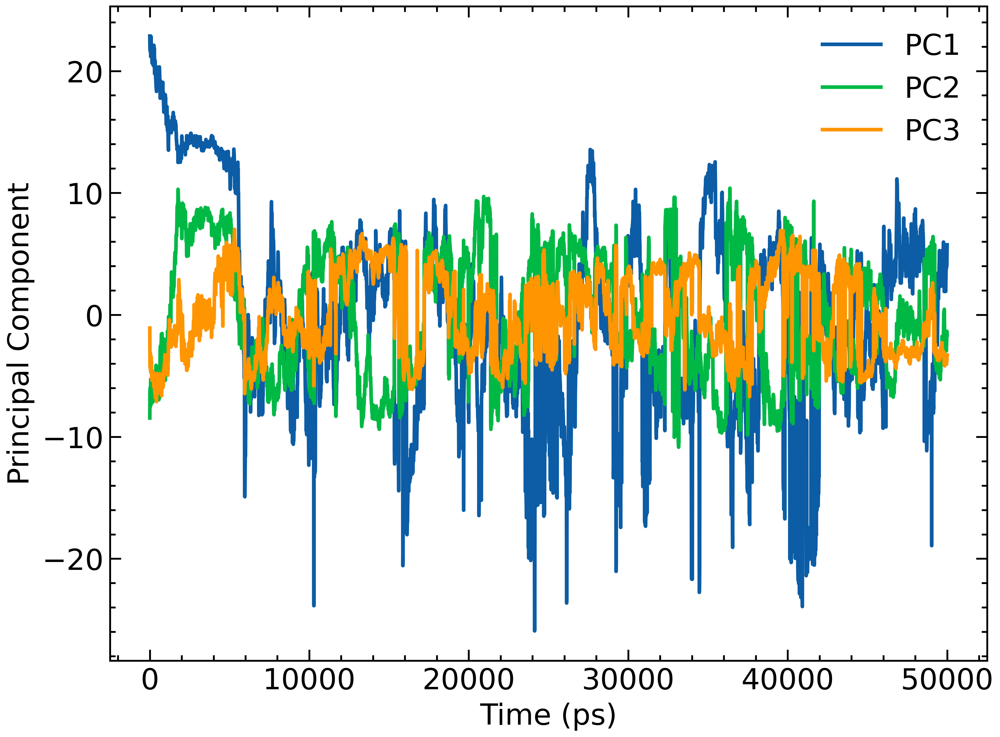

In [2]:
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','notebook'])
plt.plot(t1, pc1_data, label='PC1')
plt.plot(t2, pc2_data, label='PC2')
plt.plot(t2, pc3_data, label='PC3')
plt.xlabel('Time (ps)')
plt.ylabel('Principal Component')
plt.legend()

For PCA with respect to energy, first

```bash
paste prod_ku04amp01_pgl_complex_pc1.xvg prod_ku04amp01_pgl_complex_pc2.xvg | awk '{print $1, $2, $4}' > prod_ku04amp01_pgl_complex_pc1pc2.xvg

paste prod_ku04amp01_pgl_complex_pc2.xvg prod_ku04amp01_pgl_complex_pc3.xvg | awk '{print $1, $2, $4}' > prod_ku04amp01_pgl_complex_pc2pc3.xvg

paste prod_ku04amp01_pgl_complex_pc3.xvg prod_ku04amp01_pgl_complex_pc1.xvg | awk '{print $1, $2, $4}' > prod_ku04amp01_pgl_complex_pc3pc1.xvg
```

Then, use these PCIPCJ.xvg files to generate xpm files

```bash

gmx sham -f prod_ku04amp01_pgl_complex_pc1pc2.xvg -ls prod_ku04amp01_pgl_complex_FES12.xpm
gmx sham -f prod_ku04amp01_pgl_complex_pc2pc3.xvg -ls prod_ku04amp01_pgl_complex_FES23.xpm
gmx sham -f prod_ku04amp01_pgl_complex_pc3pc1.xvg -ls prod_ku04amp01_pgl_complex_FES31.xpm

```

Then use the following `xpm2txt.py` script to convert the .xpm file into .dat file:


In [ ]:
%%script true
#!/usr/bin/env python3

import sys

"""
Utility tool to convert xpm files generated by GROMACS to a 3-column text file.
"""

USAGE = "USAGE: xpm2txt.py -f <input xpm file> -o <output txt file> [-s]\n"
USAGE += "Options:\n"
USAGE += "\t-s\t(int)\tSorts the output by a given column"
USAGE += "\n"  # always keep this line

# Parse arguments
read_input, read_output, sort = False, False, False
xpm_file, out_file, column_sort = None, None, None
for arg in sys.argv[1:]:
    if read_input:
        read_input = False
        xpm_file = arg
    elif read_output:
        read_output = False
        out_file = arg
    elif sort:
        sort = False
        column_sort = int(arg)
    if arg.startswith("-"):
        if arg == "-f":
            read_input = True
            continue
        elif arg == "-o":
            read_output = True
            continue
        elif arg == "-s":
            sort = True
        else:
            print(USAGE)
            sys.stderr.write('ERROR: Option not recognized: %s\n' % arg)
            sys.exit(1)

if not xpm_file:
    print(USAGE)
    sys.stderr.write('ERROR: You forgot to provide an input file.\n')
    sys.exit(1)
if not out_file:
    out_file = "out.txt"

# Parse XPM file
with open(xpm_file) as xpm_handle:
    xpm_data = []
    x_axis, y_axis = [], []
    letter_to_value = {}
    for line in xpm_handle:
        if line.startswith("/* x-axis"):
            x_axis = list(map(float, line.split()[2:-2]))  # We trim the last value

        if line.startswith("/* y-axis"):
            y_axis = list(map(float, line.split()[2:-2]))  # We trim the last value

        if line.startswith('"') and x_axis and y_axis:  # Read data
            xpm_data.insert(0, line.strip().strip(',')[1:-1])

        if line.startswith('"') and len(line.split()) > 4:
            letter = line.split()[0][1:]
            value = float(line.split()[-2][1:-1])
            letter_to_value[letter] = value

# Match x/y/data
txt_values = []
for y_index, data_value in enumerate(xpm_data):
    y_value = y_axis[y_index]
    for x_index, x_value in enumerate(x_axis):
        txt_values.append([x_value, y_value, letter_to_value[data_value[x_index]]])

# Apply sorting if requested
if column_sort:
    try:
        txt_values.sort(key=lambda x: x[column_sort - 1])
    except IndexError:
        print(USAGE)
        sys.stderr.write('ERROR: Column not found (%s)\n' % (column_sort))
        sys.exit(1)

# Print to file
with open(out_file, 'w') as out_handle:
    for x, y, z in txt_values:
        out_handle.write("%3.5f\t%3.5f\t%3.5f\n" % (x, y, z))

Use this above-mentioned script as

```bash
./xpm2txt.py -f prod_ku04amp01_pgl_complex_FES12.xpm -o prod_ku04amp01_pgl_complex_FEL12.dat
./xpm2txt.py -f prod_ku04amp01_pgl_complex_FES23.xpm -o prod_ku04amp01_pgl_complex_FEL23.dat
./xpm2txt.py -f prod_ku04amp01_pgl_complex_FES31.xpm -o prod_ku04amp01_pgl_complex_FEL31.dat
```

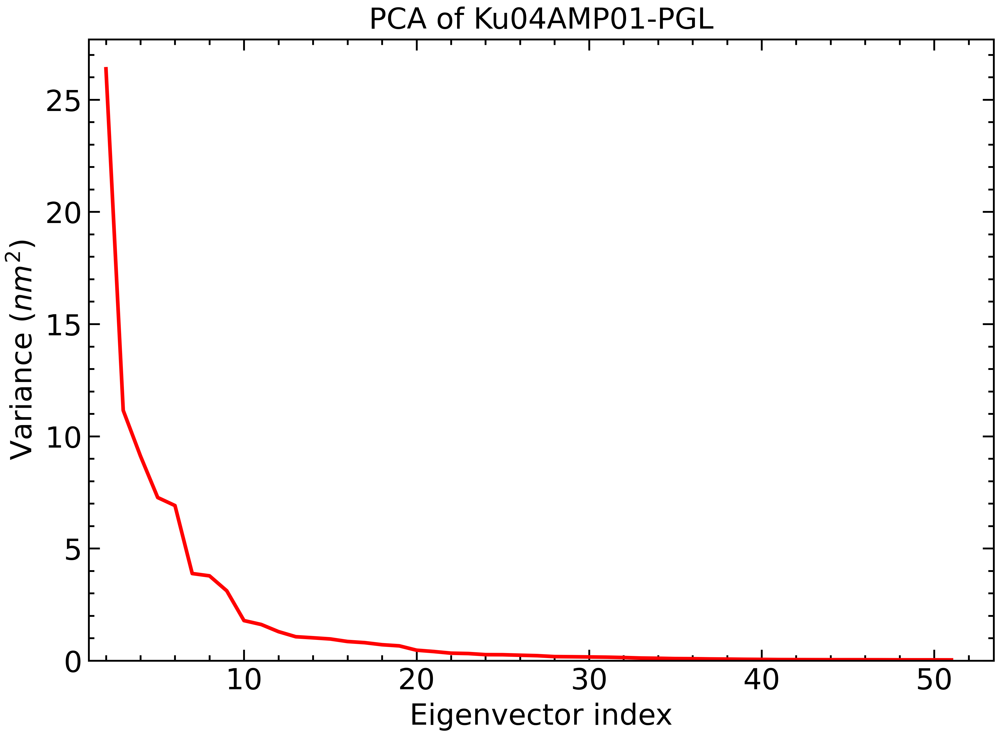

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Read input data from a file
input_file = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_FEL12.dat'
data = np.loadtxt(input_file)  # Assuming input data file ha6s PC1, PC2, and hbonds columns

PC12_1 = data[:, 0]
PC12_2 = data[:, 1]
free_energy_12 = data[:, 2]/4.184  # Convert kJ/mol to kcal/mol


input_file = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_FEL23.dat'
data = np.loadtxt(input_file)  # Assuming input data file ha6s PC1, PC2, and hbonds columns

PC23_2 = data[:, 0]
PC23_3 = data[:, 1]
free_energy_23 = data[:, 2]/4.184  # Convert kJ/mol to kcal/mol

input_file = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_FEL31.dat'
data = np.loadtxt(input_file)  # Assuming input data file ha6s PC1, PC2, and hbonds columns

PC31_3 = data[:, 0]
PC31_1 = data[:, 1]
free_energy_31 = data[:, 2]/4.184  # Convert kJ/mol to kcal/mol


# Function to read XVG file and extract data
def read_xvg(file_path):
    data = np.genfromtxt(file_path, skip_header=18)  # Adjust skip_header based on your XVG file format
    xpoints = data[:, 0]
    ypoints = data[:, 1]
    return xpoints, ypoints

# Replace these placeholders with your actual file paths
D1_path = 'ku04amp01_pgl_complex/sys_prod/prod_ku04amp01_pgl_complex_eigenvalues.xvg'

# Read data from XVG files
time_D1, D1_data = read_xvg(D1_path)

plt.plot(time_D1[0:50], D1_data[0:50], color='red')
plt.xlim(1, )
plt.ylim(0, )
plt.xlabel('Eigenvector index')
plt.ylabel(r'Variance $\left(nm^2\right)$')
plt.title('PCA of Ku04AMP01-PGL');
plt.savefig("pca-ku04amp01-pgl.png", dpi=600)


### Notabene

The first three PCA eigenvector axes might not be enough, as the fourth has a cumulative eigenvalue comparable to the third. Doing FEL for all pairs of 4 axes is complex, however. Running the sim for longer might yield sharper drops in cululative eigenvalues.

In [16]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import scienceplots

import matplotlib.pyplot as plt
size = np.array([40,12])
plt.style.use(['science','notebook'])
fig = plt.figure(figsize=size)
fig.suptitle(r'Ku04AMP01-PGL PCA: Free Energy Landscapes $\left(kcal\cdot mol^{-1}\right)$', fontsize=20)
# First subplot: free_energy_12 vs PC12
ax1 = fig.add_subplot(1, 3, 1, projection='3d')
ax1.plot_trisurf(PC12_1, PC12_2, free_energy_12, cmap='viridis', alpha=0.8)
ax1.set_xlabel(r'$PC_1\; (nm)$', labelpad=20)
ax1.set_ylabel(r'$PC_2\;(nm)$', labelpad=20)
ax1.scatter(PC12_1, PC12_2, c=free_energy_12, cmap='viridis', s=50, alpha=0.5)
ax1.scatter(pc1_data[0:100], pc2_data[0:100], 0, color='magenta', linewidth=4, label='Trajectory Start')
ax1.scatter(pc1_data[-50:-1], pc2_data[-50:-1], 0, color='red', linewidth=4, label='Trajectory End')
#ax1.legend()

# Second subplot: free_energy_23 vs PC23
ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax2.plot_trisurf(PC23_2, PC23_3, free_energy_23, cmap='viridis', alpha=0.8)
ax2.set_xlabel(r'$PC_2\; (nm)$', labelpad=20)
ax2.set_ylabel(r'$PC_3\; (nm)$', labelpad=20)
ax2.scatter(PC23_2, PC23_3, c=free_energy_23, cmap='viridis', s=50, alpha=0.5)
ax2.scatter(pc2_data[0:100], pc3_data[0:100], 0, color='magenta', linewidth=4, label='Trajectory Start')
ax2.scatter(pc2_data[-50:-1], pc3_data[-50:-1], 0, color='red', linewidth=4, label='Trajectory End')

# Third subplot: free_energy_31 vs PC31
ax3 = fig.add_subplot(1, 3, 3, projection='3d')
ax3.plot_trisurf(PC31_1, PC31_3, free_energy_31, cmap='viridis', alpha=0.8)
ax3.set_xlabel(r'$PC_3\; (nm)$', labelpad=20)
ax3.set_ylabel(r'$PC_1\; (nm)$', labelpad=20)
ax3.scatter(PC31_1, PC31_3, c=free_energy_31, cmap='viridis', s=50, alpha=0.5)
ax3.scatter(pc1_data[0:500], pc3_data[0:500], 0, color='magenta', linewidth=4, label='Trajectory Start')
ax3.scatter(pc1_data[-50:-1], pc3_data[-50:-1], 0, color='red', linewidth=4, label='Trajectory End')

for ax in [ax1, ax2, ax3]:
    ax.view_init(elev=20, azim=200)
    ax.yaxis.set_tick_params(pad=10)
    ax.set_zticks([0, 1, 2, 3, 4])

ax1.view_init(elev=20, azim=30)
ax3.view_init(elev=20, azim=0)

ax1.zaxis.set_tick_params(pad=10)
ax2.set_zticklabels([])
ax3.set_zticklabels([])
plt.savefig("pca-free-energy.svg", dpi=600)
ax2.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_2002225/183613373.py:49: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.savefig("pca-free-energy.svg", dpi=600)


The clustering is very nice here. Clearly a non-equilibrium initial state is equilibrating to something.

## TODO
Finally, I ran the following commands to project the trajectory to the PCA components and then visualize them.

`gmx anaeig -f prod_ku04amp01_pgl_complex_compact_compact.xtc -s start.pdb -extr extreme_pc.pdb -first 1 -last 3 -n prod_ku04amp01_pgl_complex_pca.ndx -nframes 80 -v prod_ku04amp01_pgl_complex_eigenvectors.trr`

Then load the three pdbs of the projections along each axis into pymol and made the following observations. The image corroborates the PCA FEL plots in that the ligand shoots out of the protein and leaves.


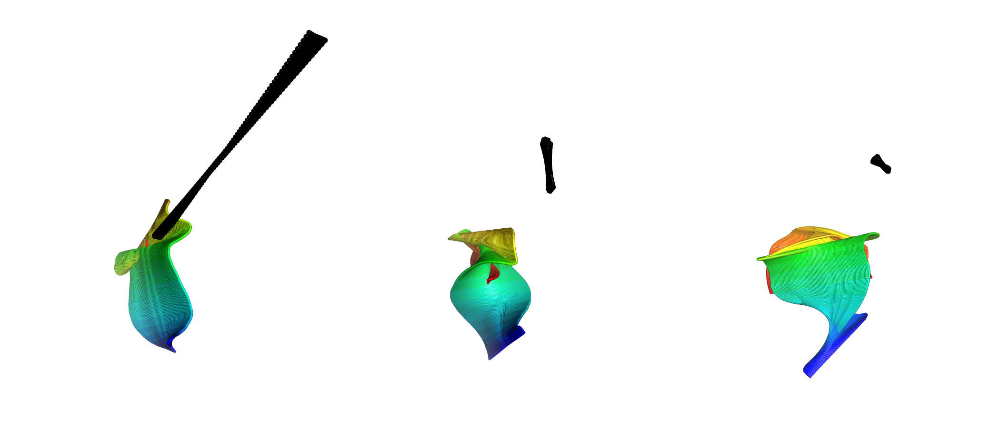

In [17]:
from IPython.display import Image
Image("pc1pc2pc3.png")

Consistent with the video, this shows that the ligand exists the peptide structure, but the relatively stable PCA trajectories indicate (as supported by the video), sone sort of orbit around the peptide.